In [1]:
import numpy as np
import pandas as pd
# import tensorflow as tf

In [2]:
# import system libs
import os
import time
import random
import pathlib
import itertools
from glob import glob
from tqdm import tqdm_notebook, tnrange

In [3]:
# import data handling tools
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.color import rgb2gray
from skimage.morphology import label
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from skimage.io import imread, imshow, concatenate_images

In [4]:
from tensorflow import keras
from tensorflow.keras import backend as K

2024-04-26 17:02:36.123917: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-26 17:02:36.124013: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-26 17:02:36.408280: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [5]:
# import Deep learning Libraries
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate

In [6]:
# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")
print ('modules loaded')

modules loaded


In [7]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split

DATASET

In [8]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split

def create_df(data_dir):
    image_dir = os.path.join(data_dir, 'image_folder')
    mask_dir = os.path.join(data_dir, 'mask_folder')

    image_files = [file for file in os.listdir(image_dir) if file.endswith('.png')]
    mask_files = [file for file in os.listdir(mask_dir) if file.endswith('.png')]

    image_files.sort()
    mask_files.sort()

    images_paths = [os.path.join(image_dir, file) for file in image_files]
    masks_paths = [os.path.join(mask_dir, file) for file in mask_files]

    df = pd.DataFrame(data={'images_paths': images_paths, 'masks_paths': masks_paths})

    return df

def split_df(df):
    train_df, dummy_df = train_test_split(df, train_size=0.8, random_state=42)
    valid_df, test_df = train_test_split(dummy_df, train_size=0.5, random_state=42)

    return train_df, valid_df, test_df

In [9]:
from tensorflow.keras.preprocessing.image import load_img,img_to_array

In [10]:
img  = '/kaggle/input/endovis2/endovis-2/image_folder/image_0.png'
img = img_to_array(load_img(img))

In [11]:
np.unique(img)

array([  9.,  10.,  13.,  15.,  16.,  18.,  19.,  20.,  21.,  22.,  23.,
        24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,  34.,
        35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,  45.,
        46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,  56.,
        57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,  67.,
        68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,  78.,
        79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,  89.,
        90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99., 100.,
       101., 102., 103., 104., 105., 106., 107., 108., 109., 110., 111.,
       112., 113., 114., 115., 116., 117., 118., 119., 120., 121., 122.,
       123., 124., 125., 126., 127., 128., 129., 130., 131., 132., 133.,
       134., 135., 136., 137., 138., 139., 140., 141., 142., 143., 144.,
       145., 146., 147., 148., 149., 150., 151., 152., 153., 154., 155.,
       156., 157., 158., 159., 160., 161., 162., 16

In [12]:
img.shape

(256, 256, 3)

In [13]:
img = '/kaggle/input/endovis2/endovis-2/mask_folder/mask_0.png'
img = img_to_array(load_img(img))

In [14]:
np.unique(img)

array([  0., 255.], dtype=float32)

In [15]:
img.shape

(256, 256, 3)

In [16]:
def create_gens(df, aug_dict):
    img_size = (224, 224)
    batch_size = 40

    img_gen = ImageDataGenerator(**aug_dict)
    msk_gen = ImageDataGenerator(**aug_dict)

    # Create general generator
    image_gen = img_gen.flow_from_dataframe(df, x_col='images_paths', class_mode=None, color_mode='rgb', target_size=img_size,
                                            batch_size=batch_size, save_to_dir=None, save_prefix='image', seed=1)

    mask_gen = msk_gen.flow_from_dataframe(df, x_col='masks_paths', class_mode=None, color_mode='grayscale', target_size=img_size,
                                            batch_size=batch_size, save_to_dir=None, save_prefix= 'mask', seed=1)

    gen = zip(image_gen, mask_gen)

    for (img, msk) in gen:
        img = img / 255
        msk = msk / 255
        msk[msk > 0.5] = 1
        msk[msk <= 0.5] = 0

        yield (img, msk)

In [17]:
data_dir = '/kaggle/input/endovis2/endovis-2'
df = create_df(data_dir)

In [18]:
train_df, valid_df, test_df = split_df(df)

In [19]:
train_df

,images_paths,masks_paths
832,/kaggle/input/endovis2/endovis-2/image_folder/...,/kaggle/input/endovis2/endovis-2/mask_folder/m...
836,/kaggle/input/endovis2/endovis-2/image_folder/...,/kaggle/input/endovis2/endovis-2/mask_folder/m...
1103,/kaggle/input/endovis2/endovis-2/image_folder/...,/kaggle/input/endovis2/endovis-2/mask_folder/m...
859,/kaggle/input/endovis2/endovis-2/image_folder/...,/kaggle/input/endovis2/endovis-2/mask_folder/m...
567,/kaggle/input/endovis2/endovis-2/image_folder/...,/kaggle/input/endovis2/endovis-2/mask_folder/m...
...,...,...
1130,/kaggle/input/endovis2/endovis-2/image_folder/...,/kaggle/input/endovis2/endovis-2/mask_folder/m...
1294,/kaggle/input/endovis2/endovis-2/image_folder/...,/kaggle/input/endovis2/endovis-2/mask_folder/m...
860,/kaggle/input/endovis2/endovis-2/image_folder/...,/kaggle/input/endovis2/endovis-2/mask_folder/m...
1459,/kaggle/input/endovis2/endovis-2/image_folder/...,/kaggle/input/endovis2/endovis-2/mask_folder/m...


In [20]:
a = list(train_df['images_paths'])
b = list(train_df['masks_paths'])

In [21]:
img_path = a[10]
mask_path = b[10]
# read image and convert it to RGB scale
image = cv2.imread(img_path)
print(image.shape)
# read mask
mask = cv2.imread(mask_path)
print(mask.shape)
# sho image and mask
# plt.imshow(image)
# plt.imshow(mask, alpha=0.4)

(256, 256, 3)
(256, 256, 3)


In [22]:
train_gen = create_gens(train_df, aug_dict={})
valid_gen = create_gens(valid_df, aug_dict={})
test_gen = create_gens(test_df, aug_dict={})

In [23]:
def show_images(images, masks):
    plt.figure(figsize=(12, 12))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        img_path = images[i]
        mask_path = masks[i]
        # read image and convert it to RGB scale
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # read mask
        mask = cv2.imread(mask_path)
        # sho image and mask
        plt.imshow(image)
        plt.imshow(mask, alpha=0.4)

        plt.axis('off')

    plt.tight_layout()
    plt.show()

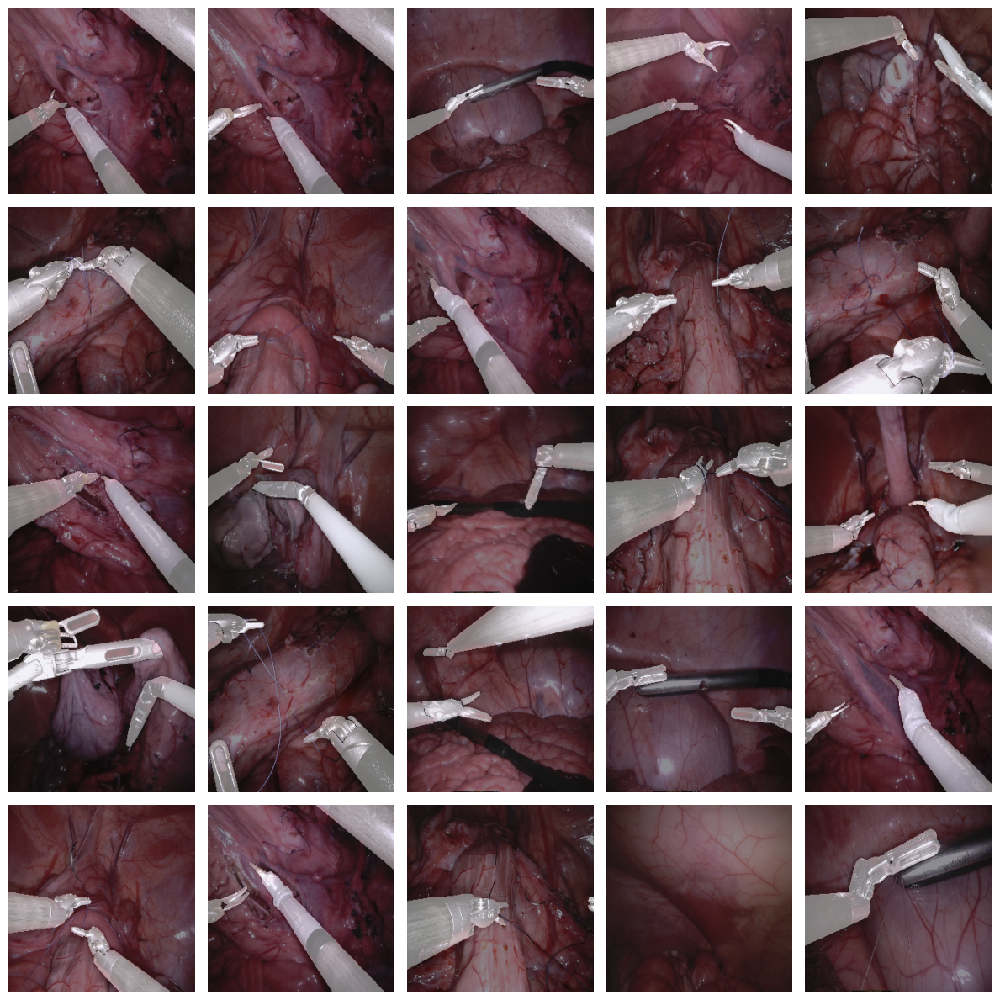

In [24]:
show_images(list(train_df['images_paths']), list(train_df['masks_paths']))

In [25]:
# Function to visualize images and masks along with their shapes
def visualize_data_with_shapes(generator, num_samples=1):
    # Extract a batch of data
    batch = next(generator)

    # Extract images and masks from the batch
    images, masks = batch

    # Print shapes of images and masks
    print("Shapes of images:")
    for i in range(num_samples):
        print(f"Image {i+1}: {images[i].shape}")

    print("\nShapes of masks:")
    for i in range(num_samples):
        print(f"Mask {i+1}: {masks[i].shape}")
        
visualize_data_with_shapes(train_gen)

# Visualize images and masks along with their shapes from valid_gen
visualize_data_with_shapes(valid_gen)

Found 1440 validated image filenames.
Found 1440 validated image filenames.
Shapes of images:
Image 1: (224, 224, 3)

Shapes of masks:
Mask 1: (224, 224, 1)
Found 180 validated image filenames.
Found 180 validated image filenames.
Shapes of images:
Image 1: (224, 224, 3)

Shapes of masks:
Mask 1: (224, 224, 1)


NETWORK

In [26]:
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
from pathlib import Path
import numpy as np
import os
from tensorflow.keras.layers import Conv2D,Dropout ,BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
import tensorflow as tf 
from sklearn.model_selection import train_test_split

In [27]:
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras import backend as keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from IPython.display import clear_output
from sklearn.model_selection import train_test_split


import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.applications import *
from tensorflow.keras.applications.inception_v3 import InceptionV3

In [28]:
# function to create dice coefficient
def dice_coef(y_true, y_pred, smooth=100):
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)

    intersection = K.sum(y_true_flatten * y_pred_flatten)
    union = K.sum(y_true_flatten) + K.sum(y_pred_flatten)
    return (2 * intersection + smooth) / (union + smooth)

# function to create dice loss
def dice_loss(y_true, y_pred, smooth=100):
    return -dice_coef(y_true, y_pred, smooth)

# function to create iou coefficient
def iou_coef(y_true, y_pred, smooth=100):
    intersection = K.sum(y_true * y_pred)
    sum = K.sum(y_true + y_pred)
    iou = (intersection + smooth) / (sum - intersection + smooth)
    return iou

In [29]:
def squeeze_excite_block(inputs, ratio=8):
    init = inputs
    channel_axis = -1
    filters = init.shape[channel_axis]
    se_shape = (1, 1, filters)

    se = GlobalAveragePooling2D()(init)
    se = Reshape(se_shape)(se)
    se = Dense(filters // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)(se)
    se = Dense(filters, activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(se)

    x = Multiply()([init, se])
    return x


from tensorflow.keras.layers import DepthwiseConv2D,SeparableConv2D

def conv_block(inputs, filters):
    x = inputs

    x = SeparableConv2D(filters,(3, 3), padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters, (3, 3), padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = squeeze_excite_block(x)

    return x

In [30]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Activation, Multiply, Concatenate, Layer, Conv2D

class ChannelAttentionModule(Layer):
    def __init__(self, ratio=8, **kwargs):
        super(ChannelAttentionModule, self).__init__(**kwargs)
        self.ratio = ratio
        self.dense1 = Dense(1, activation="relu", use_bias=False)
        self.dense2 = Dense(1, use_bias=False)

    def call(self, x):
        x1 = GlobalAveragePooling2D()(x)
        x1 = self.dense1(x1)
        x1 = self.dense2(x1)

        x2 = GlobalAveragePooling2D()(x)
        x2 = self.dense1(x2)
        x2 = self.dense2(x2)

        feats = x1 + x2
        feats = Activation("sigmoid")(feats)

        feats = Multiply()([x, feats])
        return feats
    
class SpatialAttentionModule(Layer):
    def __init__(self, **kwargs):
        super(SpatialAttentionModule, self).__init__(**kwargs)
        self.conv = Conv2D(1, kernel_size=7, padding="same", activation="sigmoid")

    def call(self, x):
        x1 = tf.reduce_mean(x, axis=-1, keepdims=True)
        x2 = tf.reduce_mean(x, axis=-1, keepdims=True)
        feats = Concatenate()([x1, x2])
        feats = self.conv(feats)
        feats = Multiply()([x, feats])
        return feats
    
    
class CBAM(Layer):
    def __init__(self, ratio=8, **kwargs):
        super(CBAM, self).__init__(**kwargs)
        self.channel_attention = ChannelAttentionModule(ratio=ratio)
        self.spatial_attention = SpatialAttentionModule()

    def call(self, x):
        x = self.channel_attention(x)
        x = self.spatial_attention(x)
        return x

In [31]:
def encoder1(inputs):
    skip_connections = []

    model = InceptionV3(include_top=False, weights='imagenet', input_tensor=inputs)
    model1 = MobileNetV2(include_top=False, weights='imagenet', input_tensor=inputs)
    model2 = DenseNet121(include_top=False, weights='imagenet', input_tensor=inputs)

    skip_connections.append(model.get_layer("input_layer").output)
    skip_connections.append(model1.get_layer("Conv1_relu").output)
    skip_connections.append(model2.get_layer("pool2_conv").output)
    skip_connections.append(model2.get_layer("pool3_conv").output)

    output = model2.get_layer("pool4_conv").output              
    return output, skip_connections

def decoder1(inputs, skip_connections):
    num_filters = [256, 128, 64, 32]
    skip_connections.reverse()
    x = inputs

    for i, f in enumerate(num_filters):
        x = UpSampling2D((2, 2), interpolation='bilinear')(x)
        # Apply CBAM to the skip connection before concatenation
#         skip_connection = CBAM()(skip_connections[i])
        skip_connection = squeeze_excite_block(skip_connections[i])
        # Concatenating
        x = Concatenate()([x, skip_connection])
        x = conv_block(x, f)

    return x

In [32]:
def encoder2(inputs):
    num_filters = [32, 64, 128, 256]
    skip_connections = []
    x = inputs

    for i, f in enumerate(num_filters):
        x = conv_block(x, f)
        skip_connections.append(x)
        x = MaxPool2D((2, 2))(x)

    return x, skip_connections

def decoder2(inputs, skip_1, skip_2):
    num_filters = [256, 128, 64, 32]
    skip_2.reverse()
    x = inputs

    for i, f in enumerate(num_filters):
        x = UpSampling2D((2, 2), interpolation='bilinear')(x)

        # Apply CBAM to the skip connections before concatenation
#         skip_connection_1 = CBAM()(skip_1[i])
#         skip_connection_2 = CBAM()(skip_2[i])
        skip_connection_1 = squeeze_excite_block(skip_1[i])
        skip_connection_2 = squeeze_excite_block(skip_2[i])
        # Concatenate the CBAM-processed skip connections with the upsampled feature map
        x = Concatenate()([x, skip_connection_1, skip_connection_2])
        
        x = conv_block(x, f)

    return x

def output_block(inputs):
    x = Conv2D(1, (1, 1), padding="same")(inputs)
    x = Activation('sigmoid')(x)
    return x

def Upsample(tensor, size):
    """Bilinear upsampling"""
    def _upsample(x, size):
        return tf.image.resize(images=x, size=size)
    return Lambda(lambda x: _upsample(x, size), output_shape=size)(tensor)

def ASPP(x, filter):
    shape = x.shape

    y1 = AveragePooling2D(pool_size=(shape[1], shape[2]))(x)
    y1 = Conv2D(filter, 1, padding="same")(y1)
    y1 = BatchNormalization()(y1)
    y1 = Activation("relu")(y1)
    y1 = UpSampling2D((shape[1], shape[2]), interpolation='bilinear')(y1)

    y2 = Conv2D(filter, 1, dilation_rate=1, padding="same", use_bias=False)(x)
    y2 = BatchNormalization()(y2)
    y2 = Activation("relu")(y2)

    y3 = Conv2D(filter, 3, dilation_rate=6, padding="same", use_bias=False)(x)
    y3 = BatchNormalization()(y3)
    y3 = Activation("relu")(y3)

    y4 = Conv2D(filter, 3, dilation_rate=12, padding="same", use_bias=False)(x)
    y4 = BatchNormalization()(y4)
    y4 = Activation("relu")(y4)

    y5 = Conv2D(filter, 3, dilation_rate=18, padding="same", use_bias=False)(x)
    y5 = BatchNormalization()(y5)
    y5 = Activation("relu")(y5)

    y = Concatenate()([y1, y2, y3, y4, y5])

    y = Conv2D(filter, 1, dilation_rate=1, padding="same", use_bias=False)(y)
    y = BatchNormalization()(y)
    y = Activation("relu")(y)

    return y

In [33]:
def build_model(shape):
    inputs = Input(shape)
    x, skip_1 = encoder1(inputs)
    x = ASPP(x, 64)
    x = decoder1(x, skip_1)
    outputs1 = output_block(x)

    x = inputs * outputs1

    x, skip_2 = encoder2(x)
    x = ASPP(x, 64)
    
    x = decoder2(x, skip_1, skip_2)
    outputs2 = output_block(x)
    outputs = outputs1*outputs2

    model = Model(inputs, outputs)
    return model

In [34]:
model = build_model((224,224,3))

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [35]:
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.optimizers import Adam

# Assuming your model is already defined
model.compile(optimizer=Adam(learning_rate=1e-5), 
              loss=binary_crossentropy,
              metrics=[dice_coef, 'binary_accuracy', iou_coef])

In [36]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 9,250,963 (35.29 MB)

 Trainable params: 9,190,163 (35.06 MB)

 Non-trainable params: 60,800 (237.50 KB)

In [37]:
from keras.callbacks import ModelCheckpoint

epochs = 150
batch_size = 20

# Define custom callback
class EarlyStopAccuracyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs.get('val_dice_coef') >= 0.96:
            self.model.stop_training = True

# Instantiate the callback
early_stop_accuracy_callback = EarlyStopAccuracyCallback()

# Define other callbacks
callbacks = [
    ModelCheckpoint('dep_mobile_2_unet.keras', verbose=0, save_best_only=True),
    early_stop_accuracy_callback
]

In [38]:
history = model.fit(train_gen,
                    steps_per_epoch=int(len(train_df) / batch_size),
                    epochs=epochs,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=valid_gen,
                    validation_steps=int(len(valid_df) / batch_size))

Epoch 1/150


2024-04-26 17:05:38.227757: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng3{k11=2} for conv (f32[40,67,224,224]{3,2,1,0}, u8[0]{0}) custom-call(f32[40,67,224,224]{3,2,1,0}, f32[67,1,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, feature_group_count=67, custom_call_target="__cudnn$convForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-04-26 17:05:38.562131: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.334576352s
Trying algorithm eng3{k11=2} for conv (f32[40,67,224,224]{3,2,1,0}, u8[0]{0}) custom-call(f32[40,67,224,224]{3,2,1,0}, f32[67,1,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, feature_group_count=67, custom_call_target="__cudnn$convForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while.

72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - binary_accuracy: 0.8710 - dice_coef: 0.2283 - iou_coef: 0.1294 - loss: 0.3946

2024-04-26 17:12:38.562683: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng12{k5=1,k6=0,k7=1,k10=1} for conv (f32[20,99,224,224]{3,2,1,0}, u8[0]{0}) custom-call(f32[20,99,224,224]{3,2,1,0}, f32[99,1,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, feature_group_count=99, custom_call_target="__cudnn$convForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-04-26 17:12:38.769803: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.207214161s
Trying algorithm eng12{k5=1,k6=0,k7=1,k10=1} for conv (f32[20,99,224,224]{3,2,1,0}, u8[0]{0}) custom-call(f32[20,99,224,224]{3,2,1,0}, f32[99,1,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, feature_group_count=99, custom_call_target="__cudnn$convForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyr

72/72 ━━━━━━━━━━━━━━━━━━━━ 561s 3s/step - binary_accuracy: 0.8711 - dice_coef: 0.2288 - iou_coef: 0.1298 - loss: 0.3941 - val_binary_accuracy: 0.8700 - val_dice_coef: 0.1752 - val_iou_coef: 0.0961 - val_loss: 0.4425
Epoch 2/150
72/72 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - binary_accuracy: 0.9215 - dice_coef: 0.3705 - iou_coef: 0.2278 - loss: 0.2923 - val_binary_accuracy: 0.8698 - val_dice_coef: 0.1791 - val_iou_coef: 0.0985 - val_loss: 0.4518
Epoch 3/150
72/72 ━━━━━━━━━━━━━━━━━━━━ 111s 2s/step - binary_accuracy: 0.9496 - dice_coef: 0.4657 - iou_coef: 0.3039 - loss: 0.2359 - val_binary_accuracy: 0.8700 - val_dice_coef: 0.1792 - val_iou_coef: 0.0985 - val_loss: 0.4545
Epoch 4/150
72/72 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - binary_accuracy: 0.9616 - dice_coef: 0.5357 - iou_coef: 0.3661 - loss: 0.1988 - val_binary_accuracy: 0.8672 - val_dice_coef: 0.1798 - val_iou_coef: 0.0989 - val_loss: 0.4515
Epoch 5/150
72/72 ━━━━━━━━━━━━━━━━━━━━ 113s 2s/step - binary_accuracy: 0.9676 - dice_coef: 0.5874 - 

In [39]:
def plot_training(hist):
    '''
    This function take training model and plot history of accuracy and losses with the best epoch in both of them.
    '''

    # Define needed variables
    tr_acc = hist.history['binary_accuracy']
    tr_iou = hist.history['iou_coef']
    tr_dice = hist.history['dice_coef']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_binary_accuracy']
    val_iou = hist.history['val_iou_coef']
    val_dice = hist.history['val_dice_coef']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_iou = np.argmax(iou_coef)
    iou_highest = val_iou[index_iou]
    index_dice = np.argmax(dice_coef)
    dice_highest = val_dice[index_dice]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch= {str(index_acc + 1)}'
    iou_label = f'best epoch= {str(index_iou + 1)}'
    dice_label = f'best epoch= {str(index_dice + 1)}'
    loss_label = f'best epoch= {str(index_loss + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # Training Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
#     plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training IoU
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_iou, 'r', label= 'Training IoU')
    plt.plot(Epochs, val_iou, 'g', label= 'Validation IoU')
#     plt.scatter(index_iou + 1 , iou_highest, s= 150, c= 'blue', label= iou_label)
    plt.title('Training and Validation IoU Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.legend()

    # Training Dice
    plt.subplot(2, 2, 3)
    plt.plot(Epochs, tr_dice, 'r', label= 'Training Dice')
    plt.plot(Epochs, val_dice, 'g', label= 'Validation Dice')
#     plt.scatter(index_dice + 1 , dice_highest, s= 150, c= 'blue', label= dice_label)
    plt.title('Training and Validation Dice Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('Dice')
    plt.legend()

    # Training Loss
    plt.subplot(2, 2, 4)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
#     plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

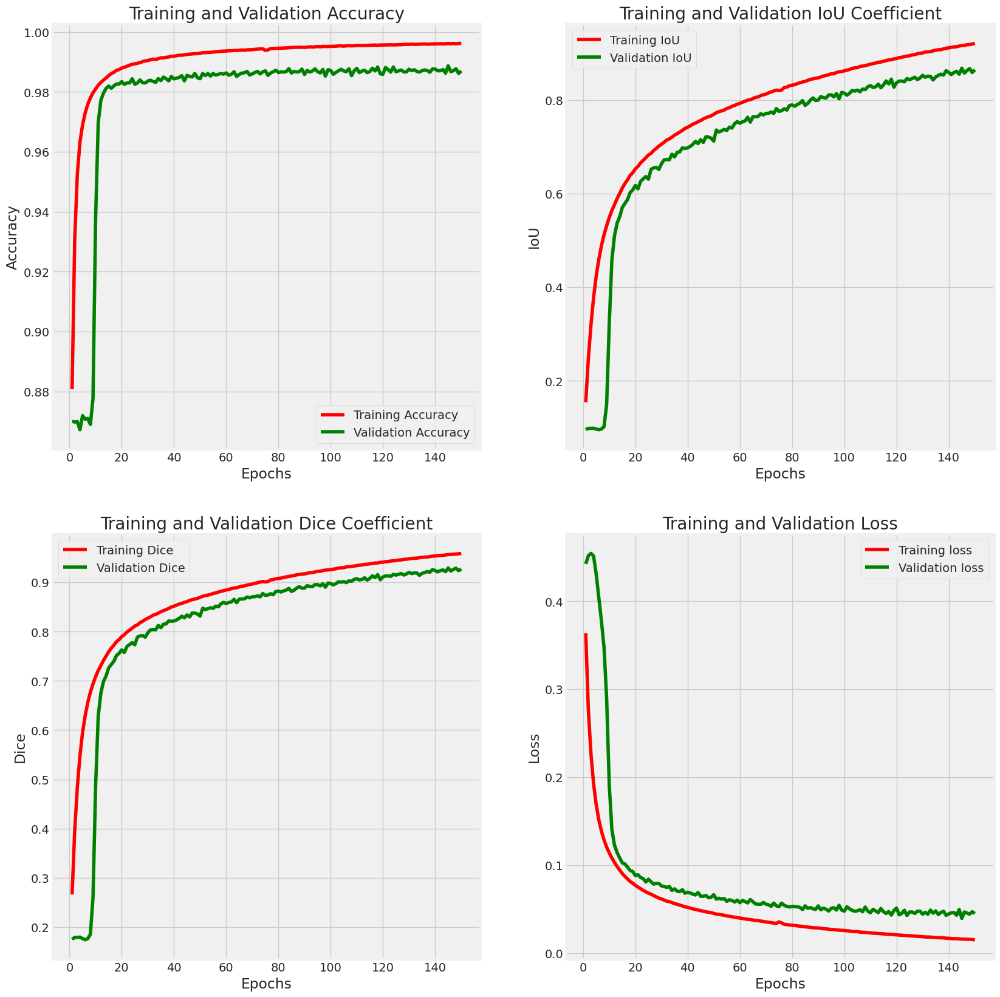

In [40]:
plot_training(history)

In [41]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)


print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print("Train IoU: ", train_score[2])
print("Train Dice: ", train_score[3])
print('-' * 20)

print("Valid Loss: ", valid_score[0])
print("Valid Accuracy: ", valid_score[1])
print("Valid IoU: ", valid_score[2])
print("Valid Dice: ", valid_score[3])
print('-' * 20)

print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])
print("Test IoU: ", test_score[2])
print("Test Dice: ", test_score[3])


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 378ms/step - binary_accuracy: 0.9965 - dice_coef: 0.9614 - iou_coef: 0.9257 - loss: 0.0147
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 388ms/step - binary_accuracy: 0.9897 - dice_coef: 0.9354 - iou_coef: 0.8787 - loss: 0.0362
Found 180 validated image filenames.
Found 180 validated image filenames.
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 547ms/step - binary_accuracy: 0.9882 - dice_coef: 0.9325 - iou_coef: 0.8739 - loss: 0.0420
Train Loss:  0.014458205550909042
Train Accuracy:  0.9605571627616882
Train IoU:  0.9965196847915649
Train Dice:  0.9241266846656799
--------------------
Valid Loss:  0.03641101345419884
Valid Accuracy:  0.9361955523490906
Valid IoU:  0.9896721839904785
Valid Dice:  0.8800780177116394
--------------------
Test Loss:  0.0454523004591465
Test Accuracy:  0.9303777813911438
Test IoU:  0.9875162839889526
Test Dice:  0.8700440526008606


1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step


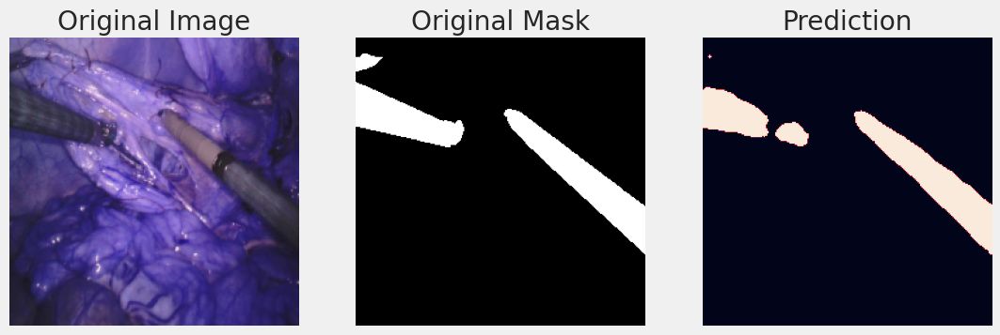

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


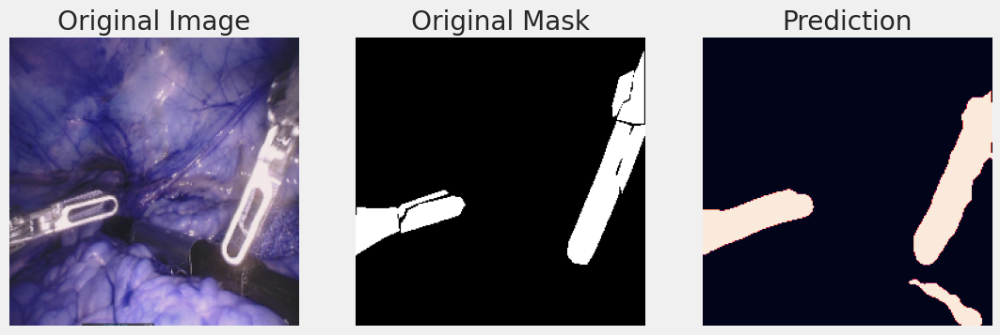

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


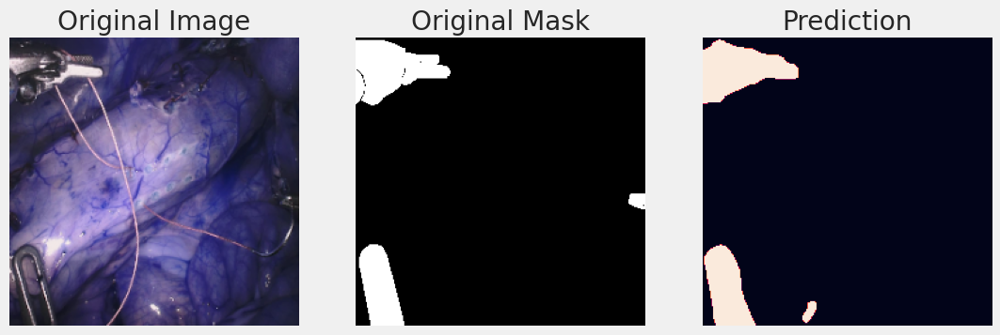

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


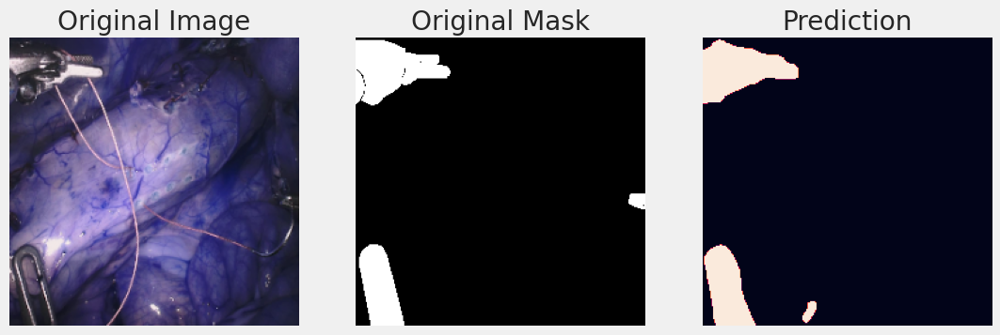

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


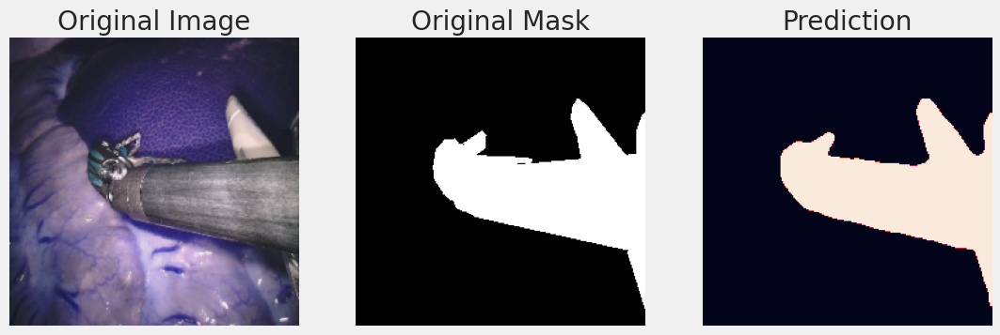

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


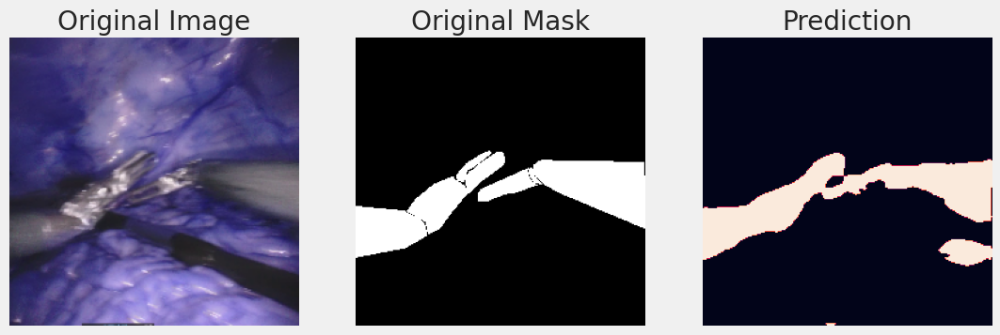

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


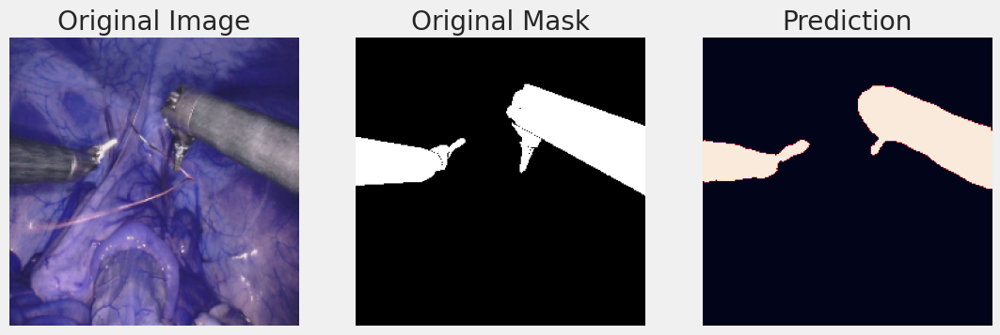

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


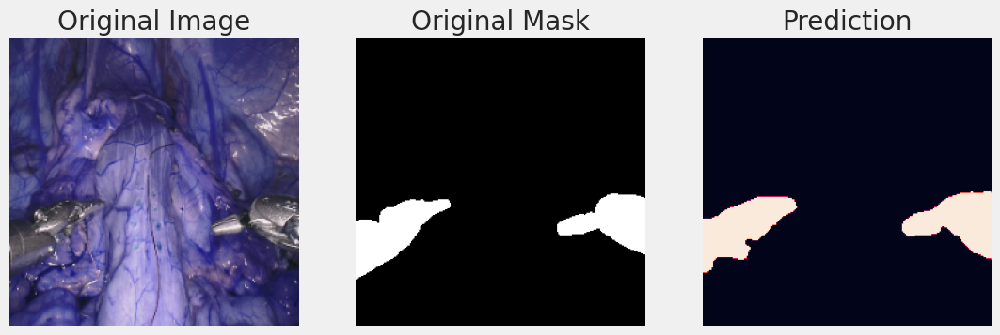

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


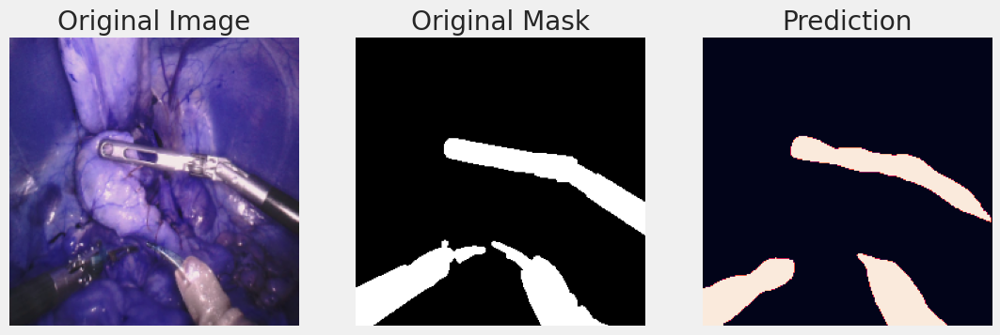

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


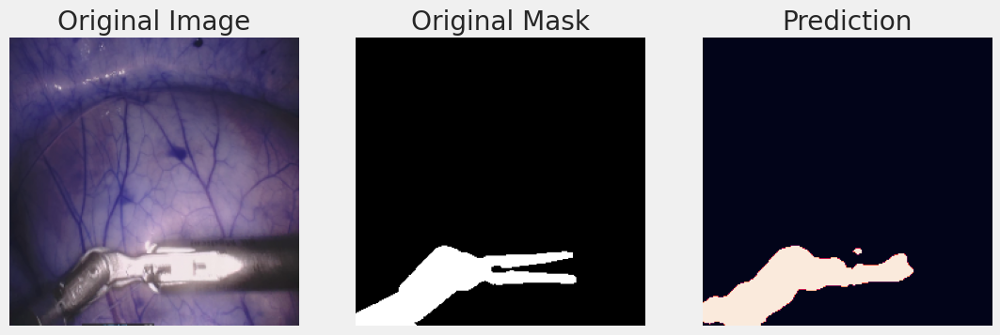

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


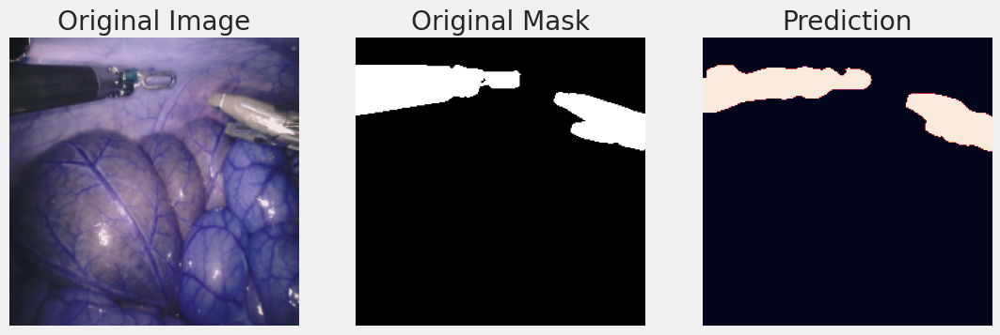

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


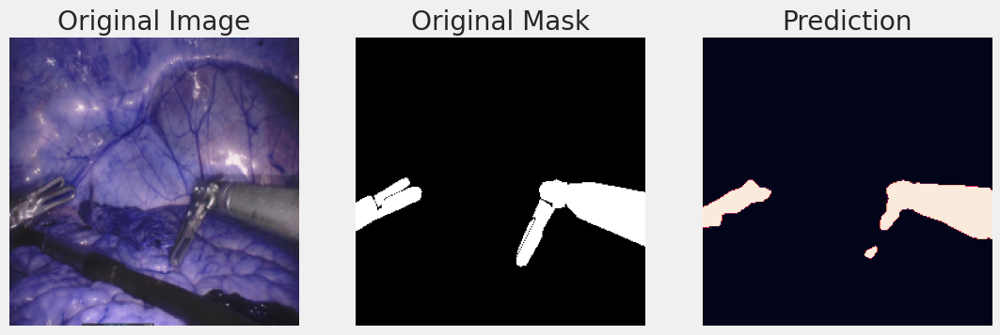

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


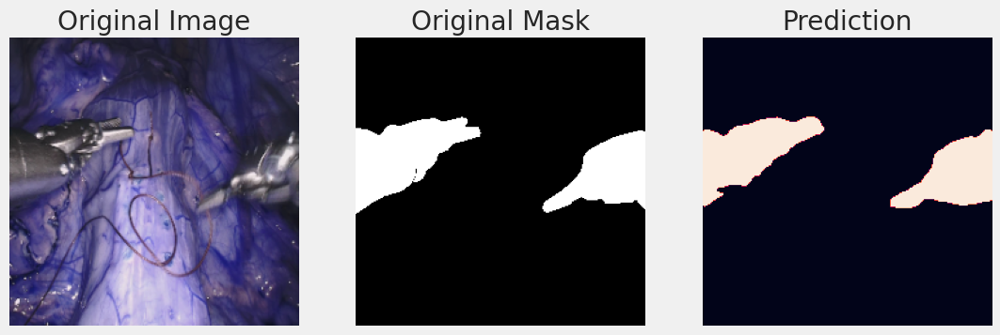

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


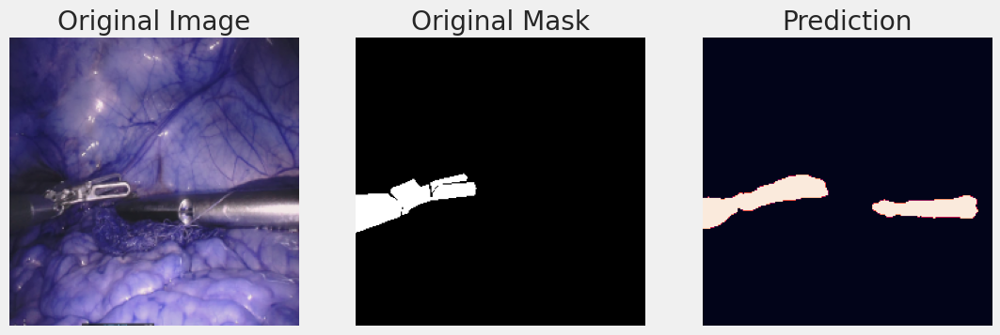

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


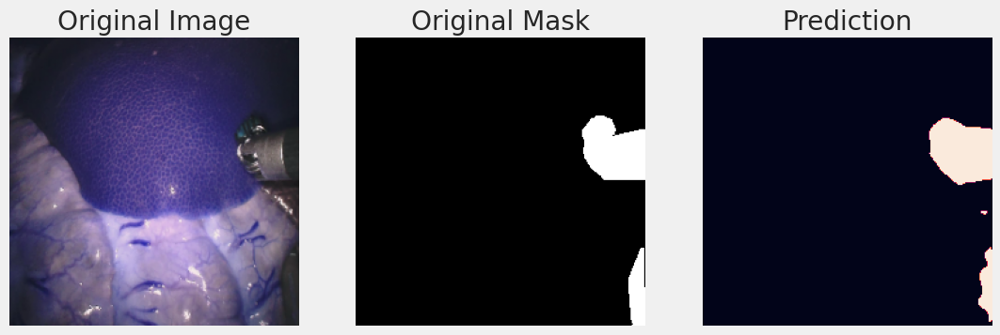

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


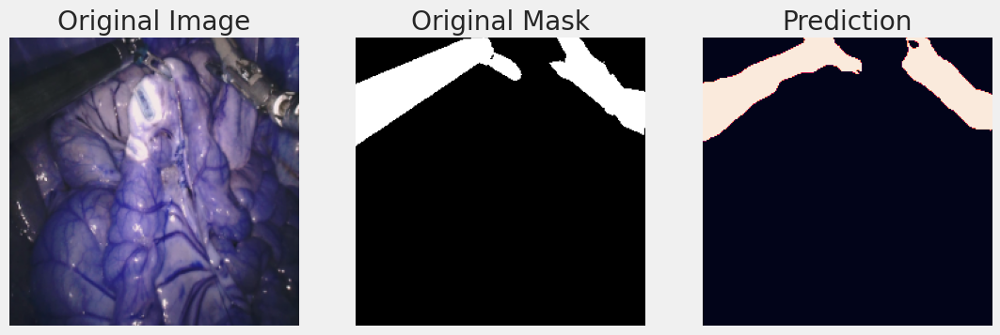

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


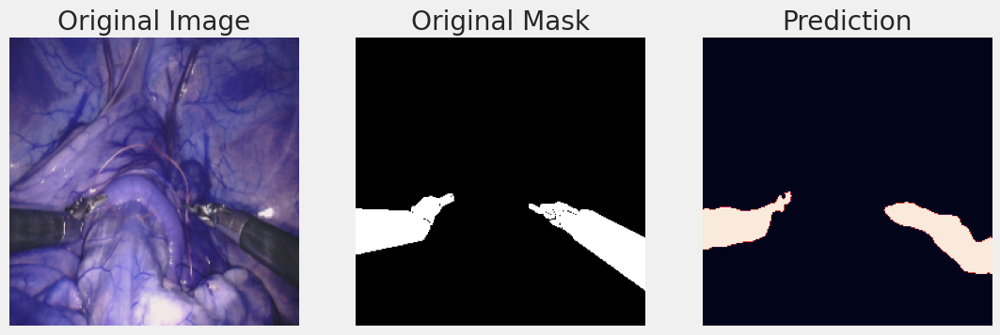

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


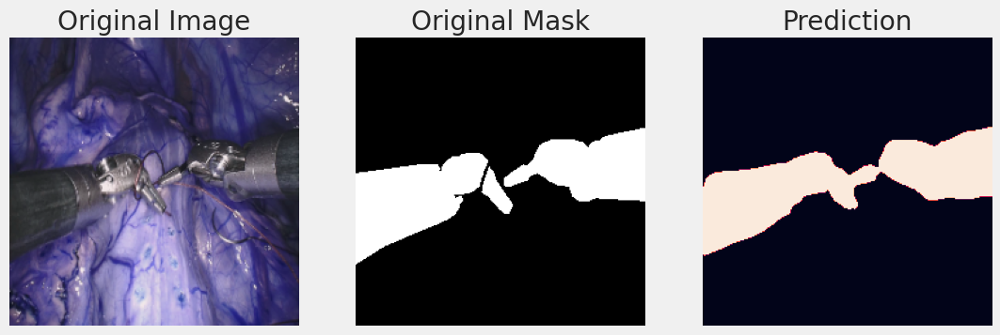

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


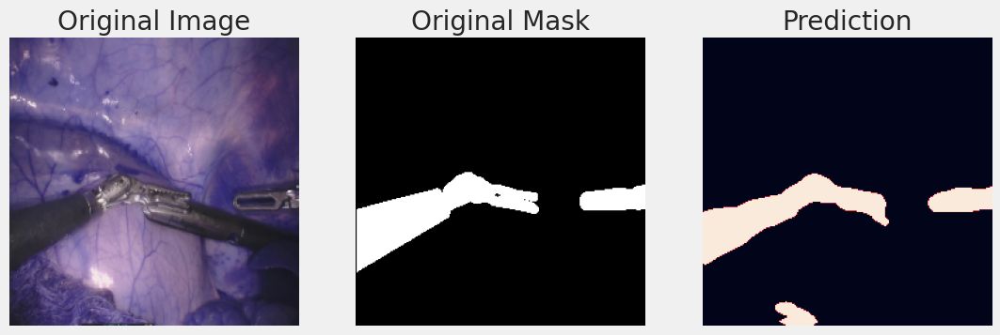

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


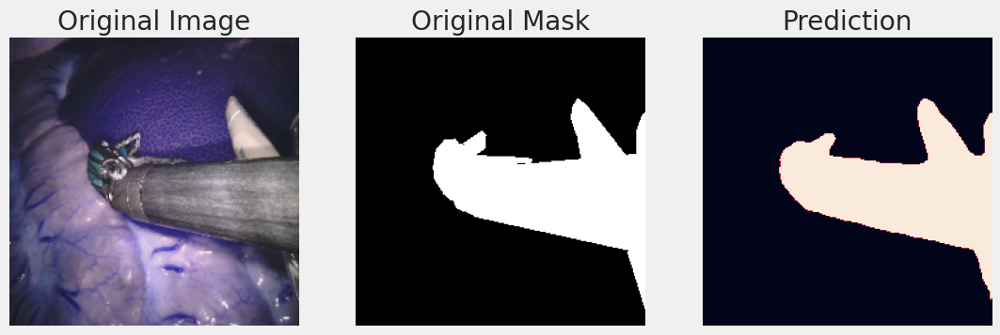

In [42]:
for _ in range(20):
    index = np.random.randint(1, len(test_df.index))
    img = cv2.imread(test_df['images_paths'].iloc[index])
    img = cv2.resize(img, (224, 224))
    img = img/255
    img = img[np.newaxis, :, :, : ]

    predicted_img = model.predict(img)

    plt.figure(figsize=(12, 12))
    
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(img))
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(cv2.imread(test_df['masks_paths'].iloc[index])))
    plt.axis('off')
    plt.title('Original Mask')

    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(predicted_img) > 0.5 )
    plt.title('Prediction')
    plt.axis('off')
    
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


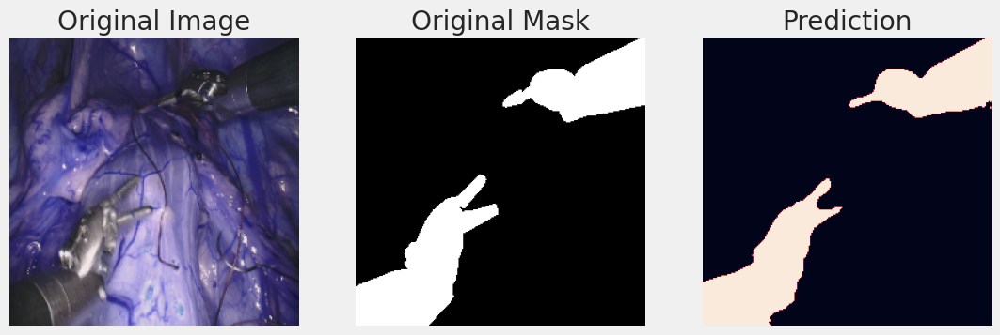

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


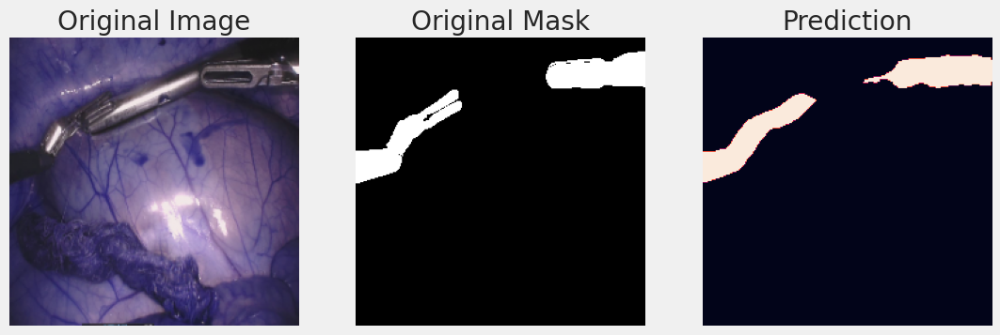

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


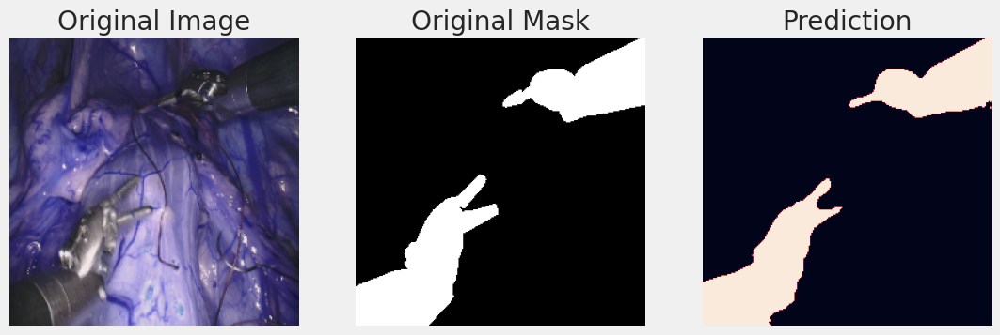

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


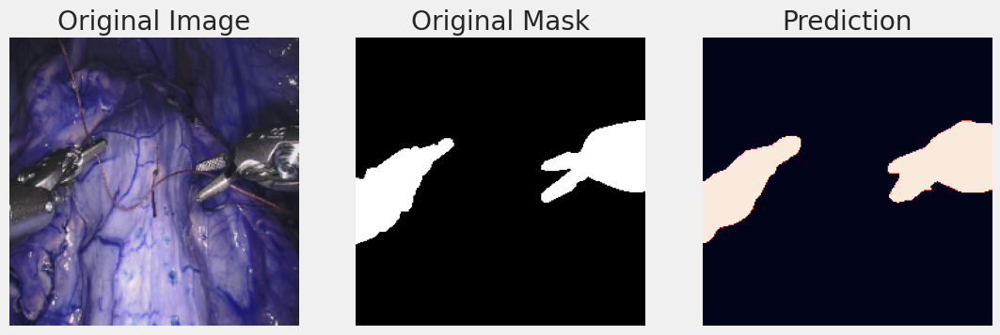

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


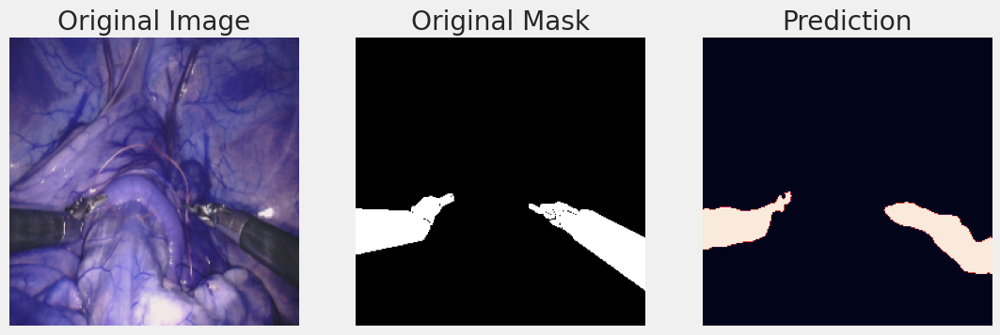

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


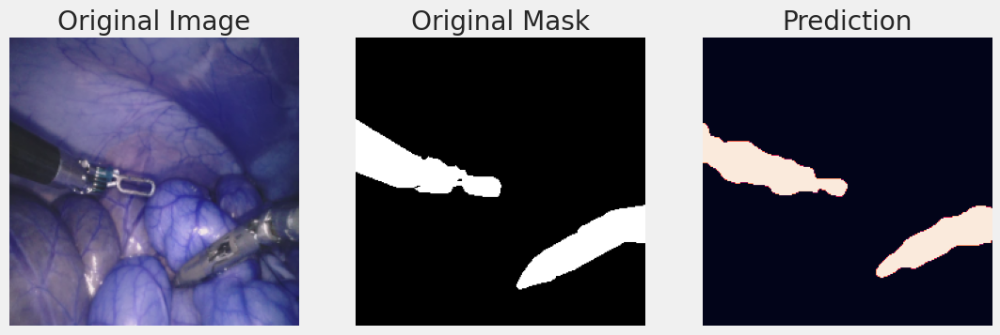

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


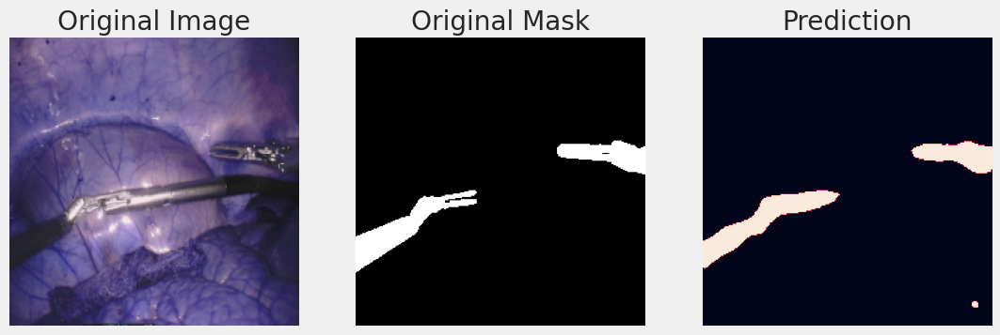

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


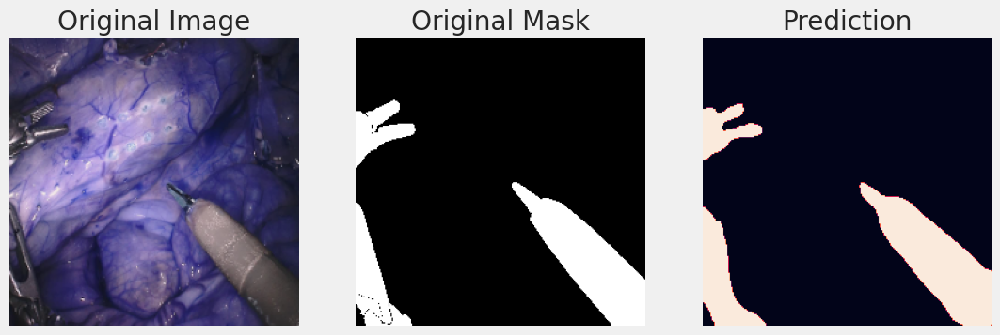

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


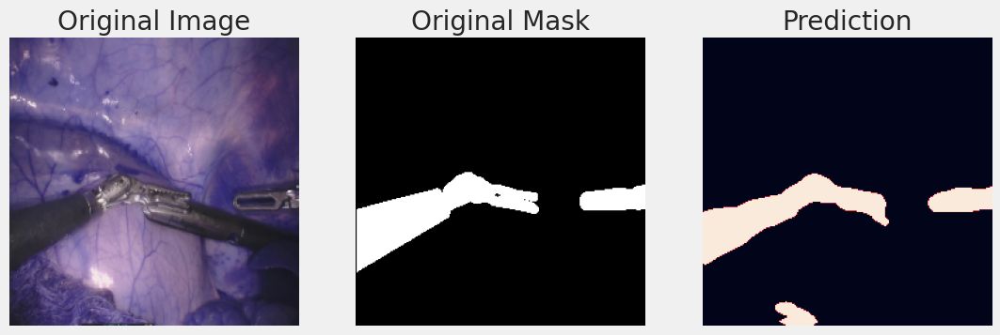

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


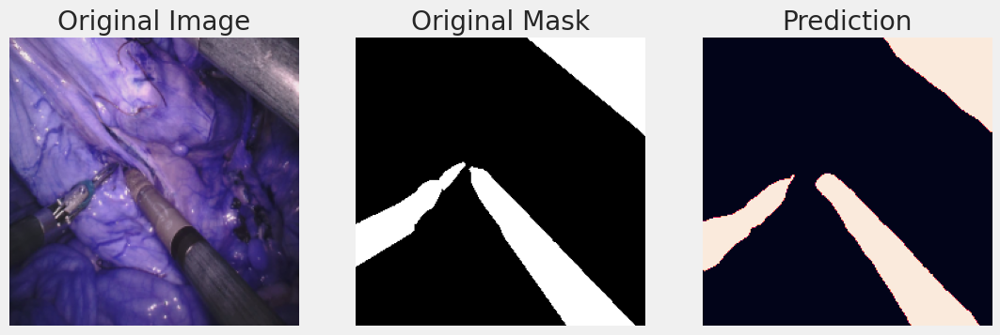

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


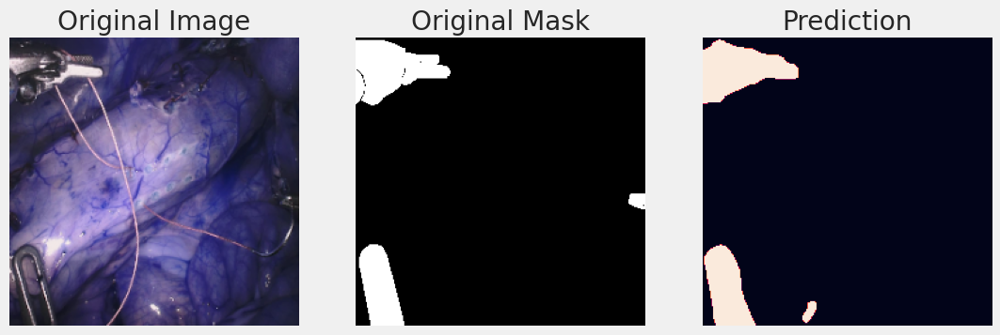

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


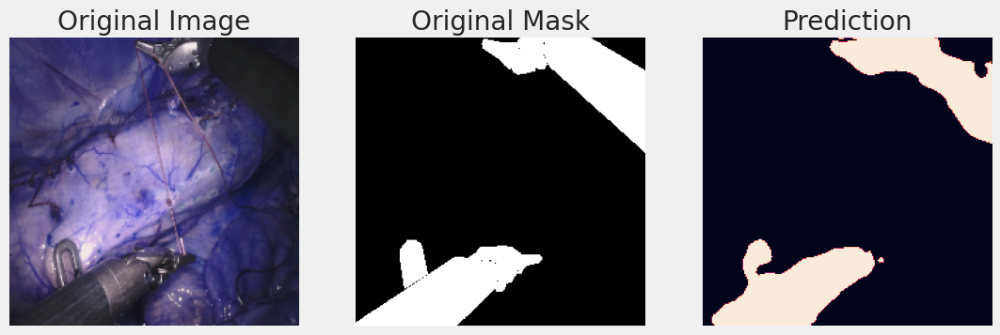

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


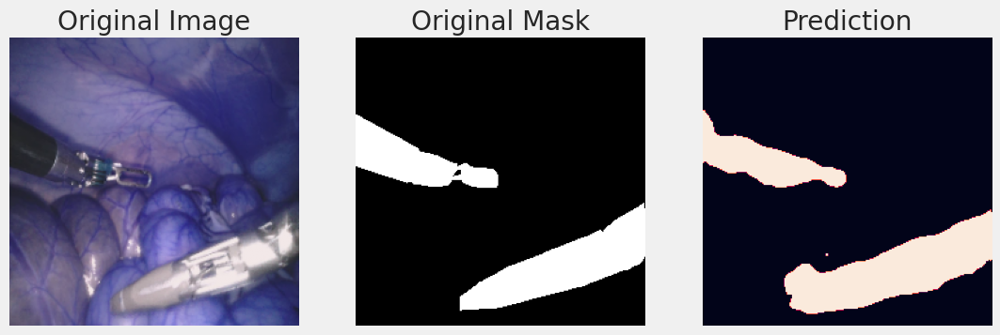

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


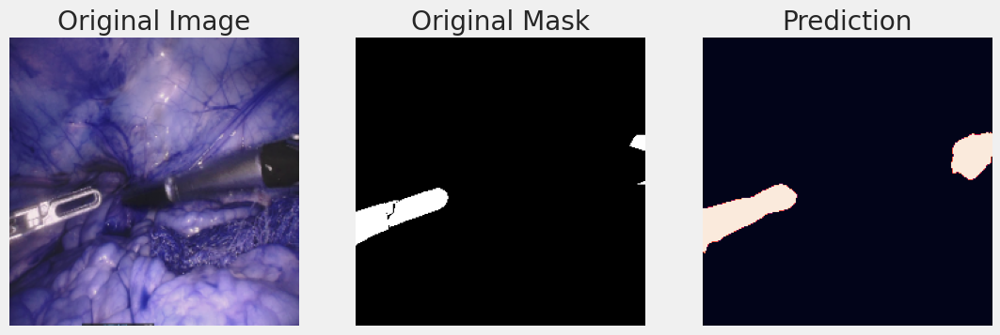

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


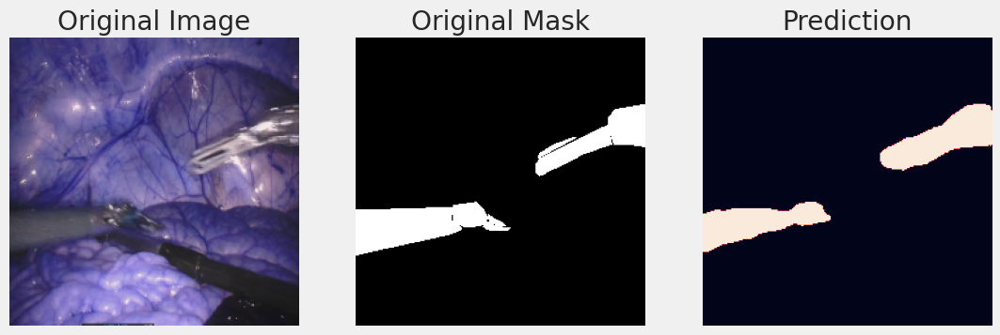

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


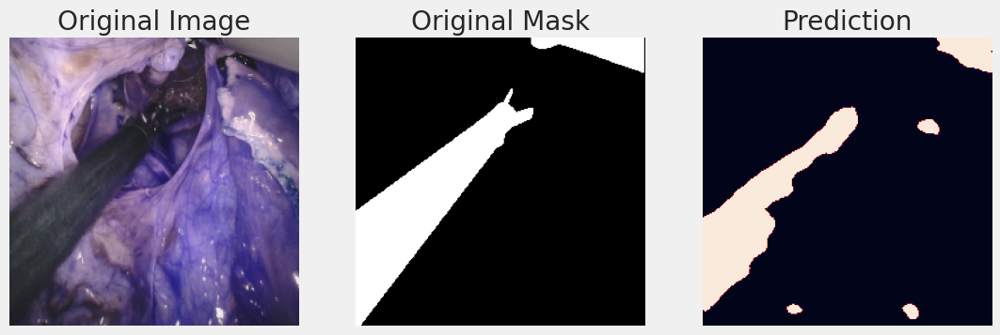

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


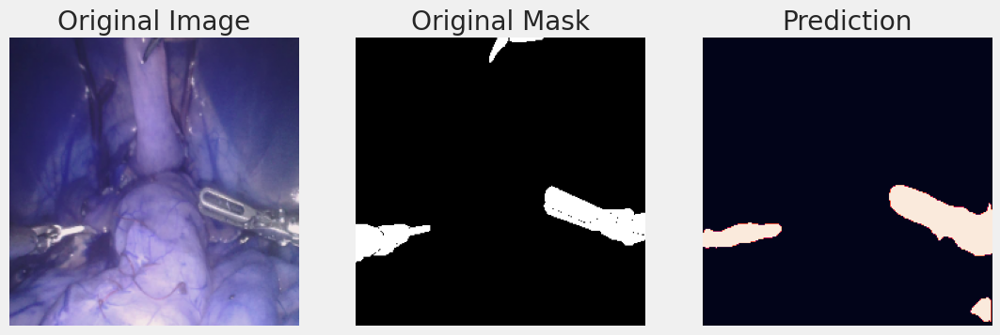

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


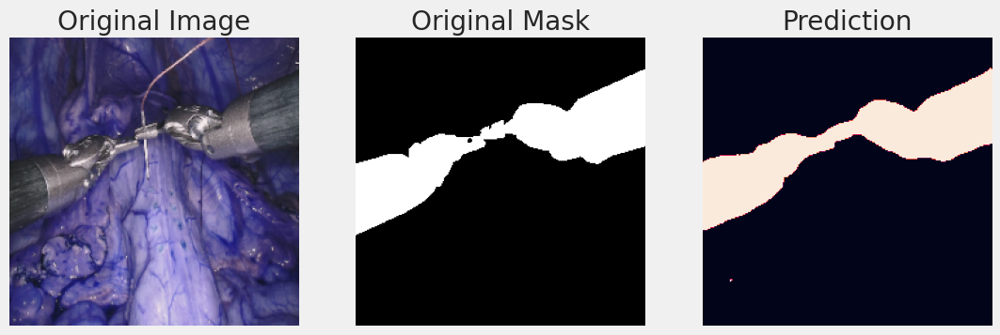

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


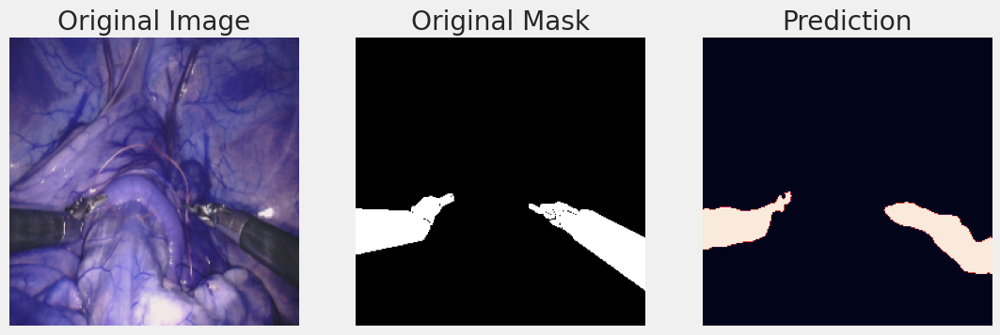

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


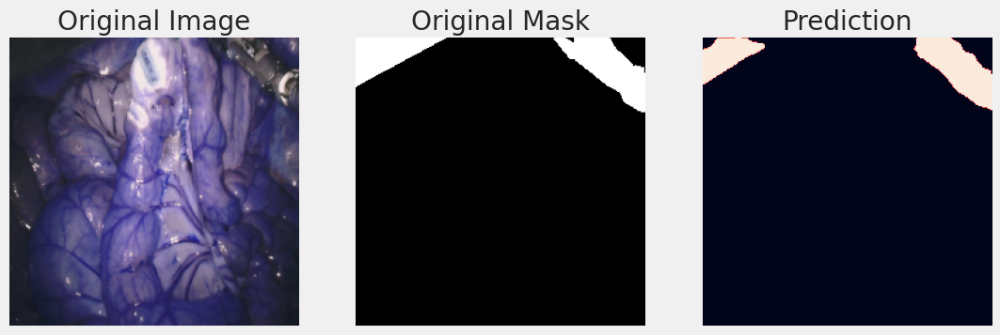

In [43]:
for _ in range(20):
    index = np.random.randint(1, len(test_df.index))
    img = cv2.imread(test_df['images_paths'].iloc[index])
    img = cv2.resize(img, (224, 224))
    img = img/255
    img = img[np.newaxis, :, :, : ]

    predicted_img = model.predict(img)

    plt.figure(figsize=(12, 12))
    
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(img))
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(cv2.imread(test_df['masks_paths'].iloc[index])))
    plt.axis('off')
    plt.title('Original Mask')

    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(predicted_img) > 0.5 )
    plt.title('Prediction')
    plt.axis('off')
    
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


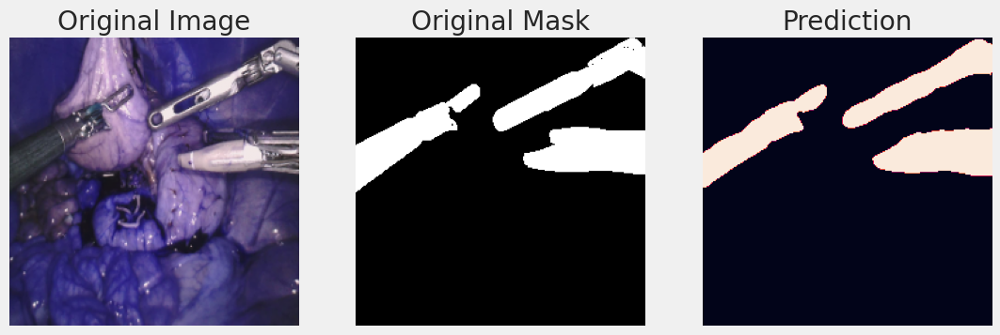

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


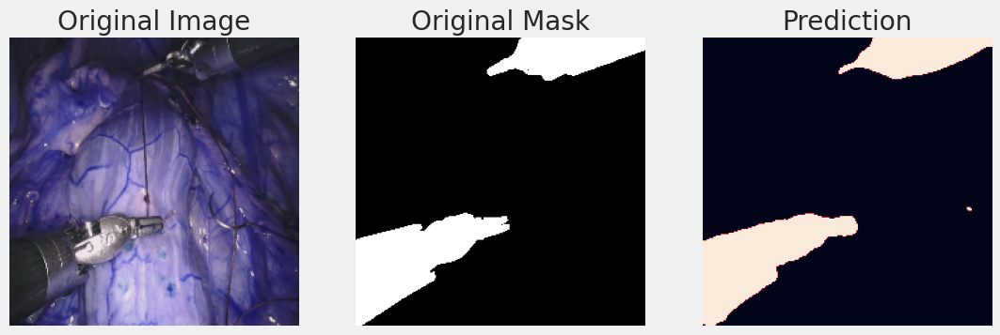

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


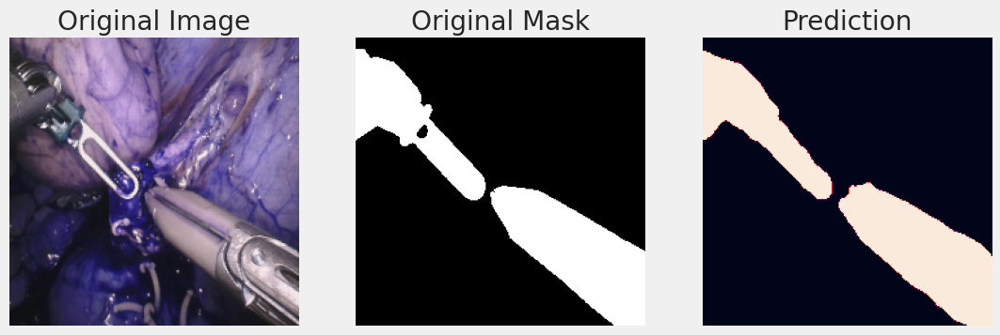

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


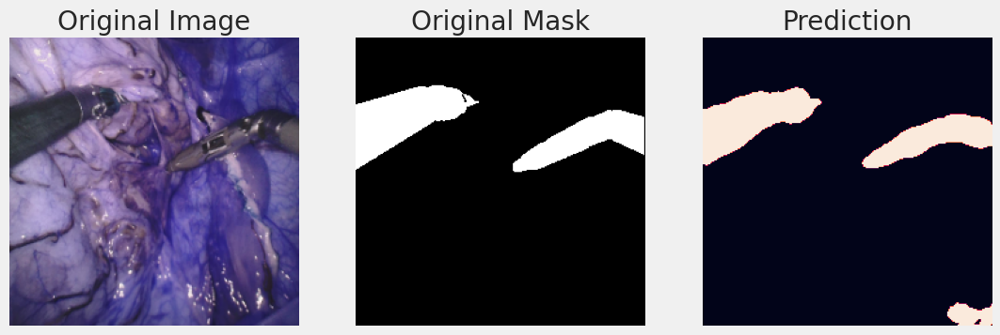

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


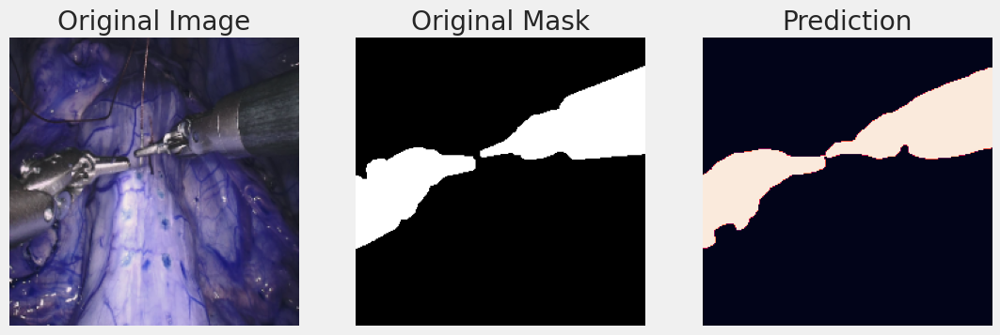

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


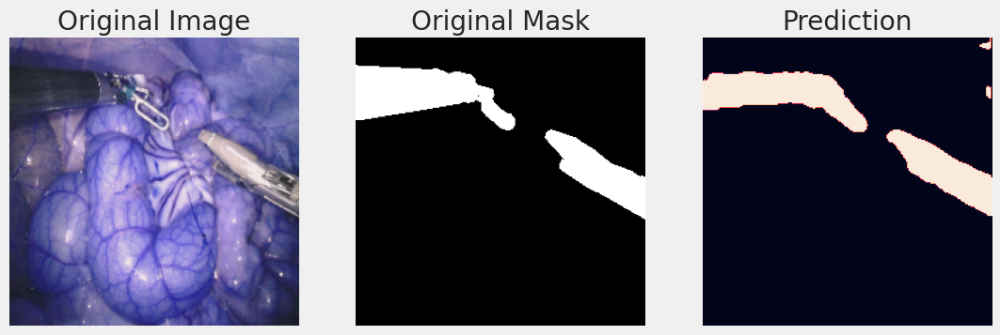

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


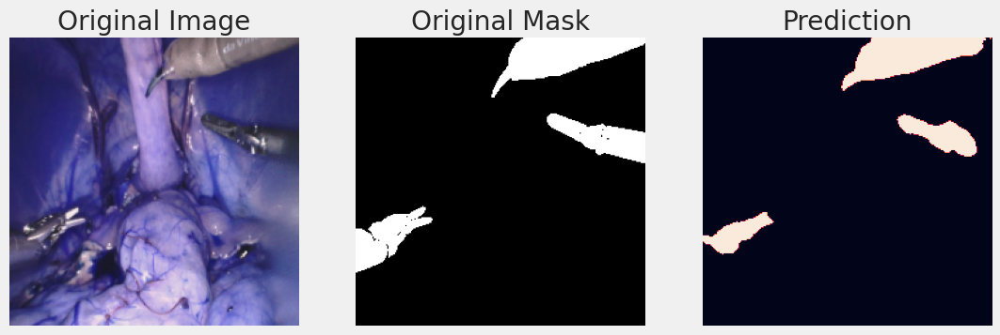

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


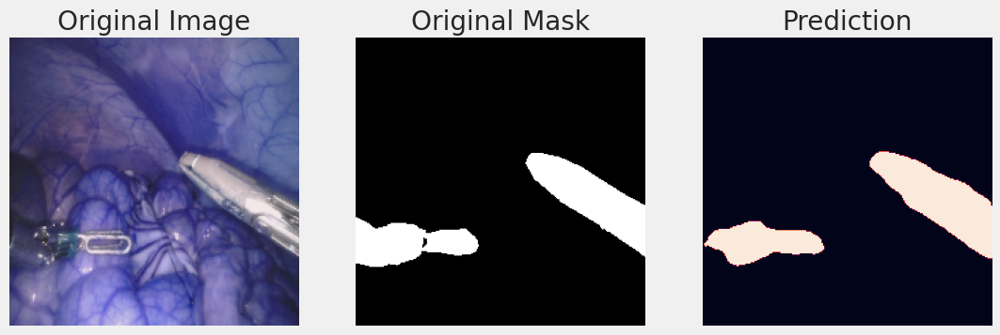

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


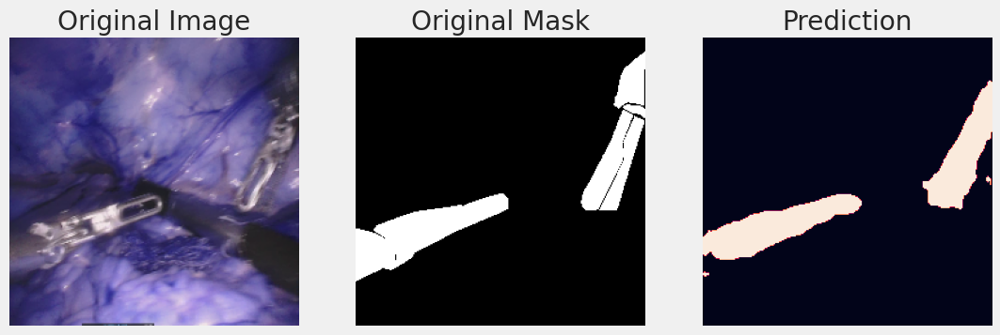

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


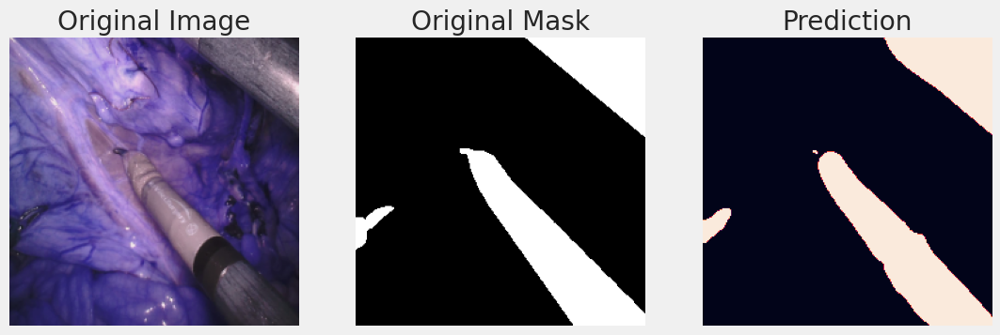

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


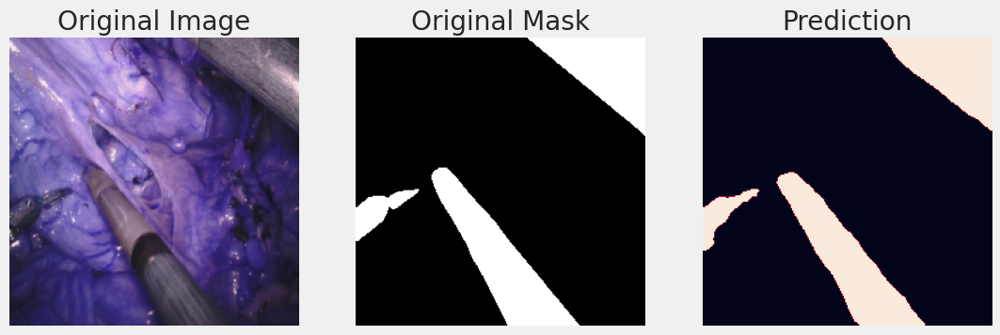

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


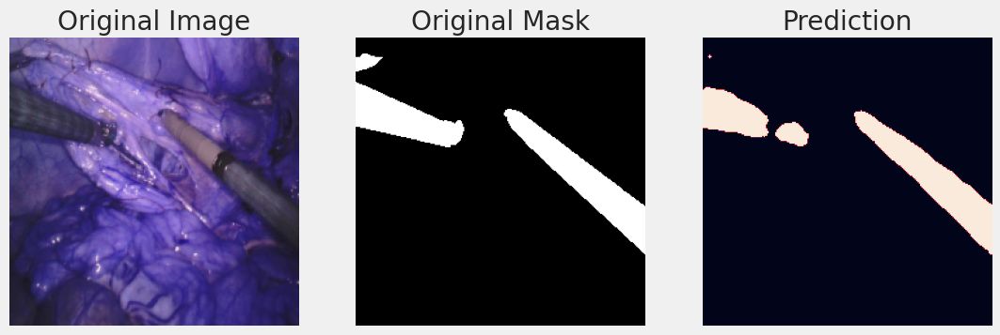

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


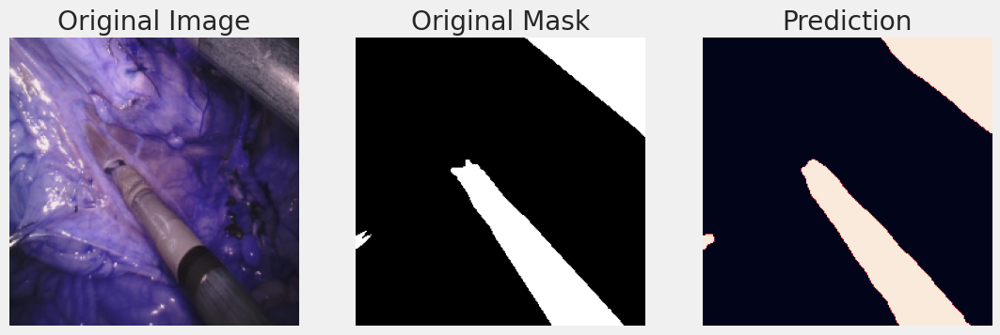

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


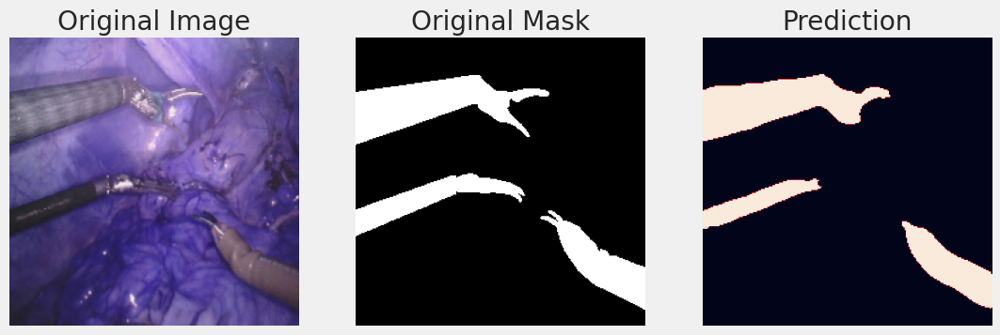

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


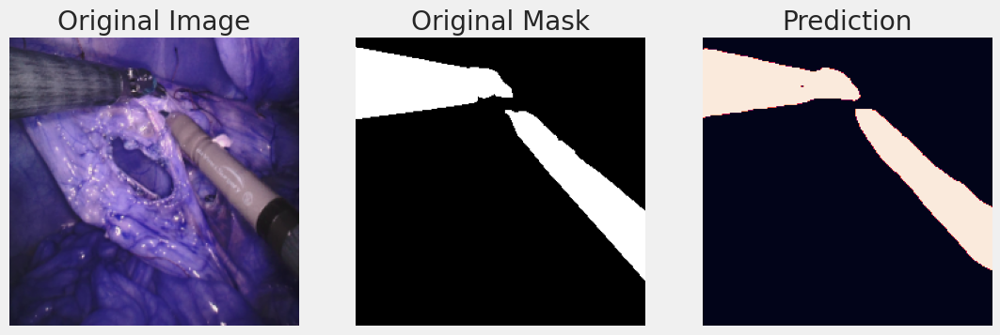

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


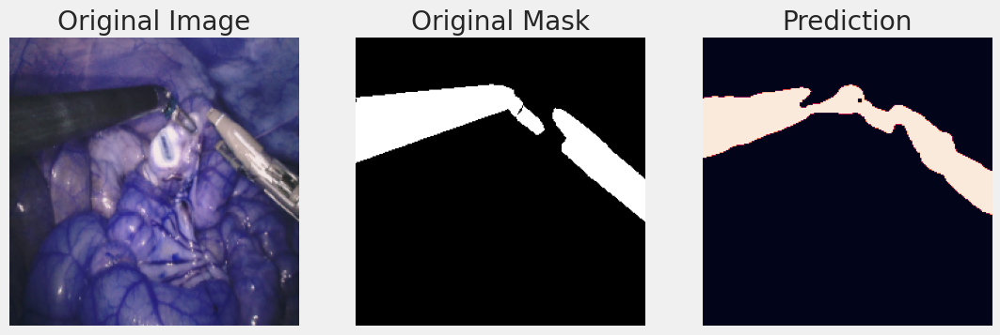

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


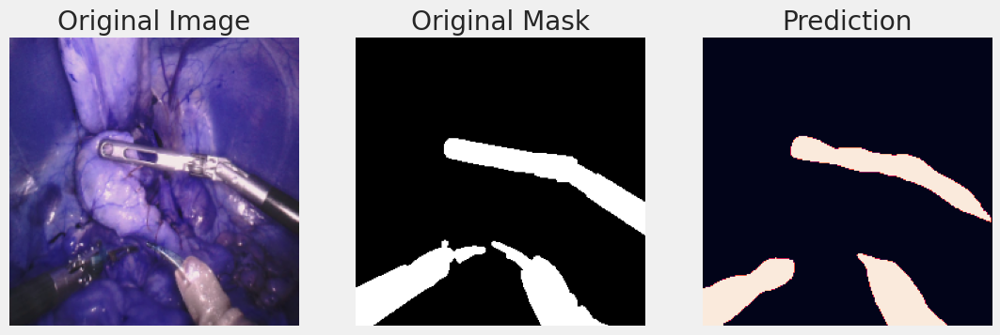

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


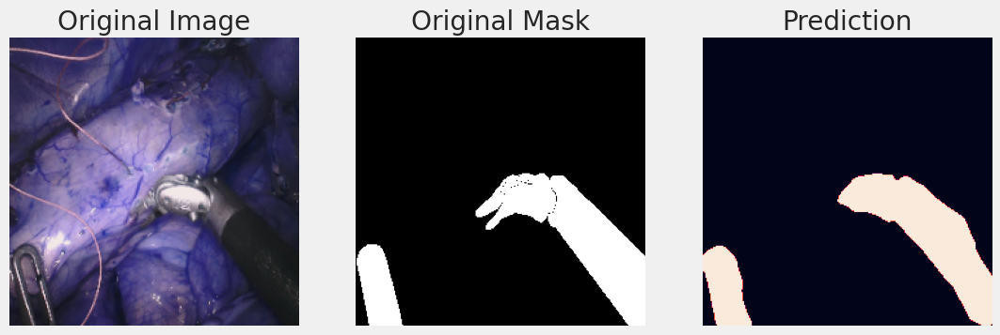

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


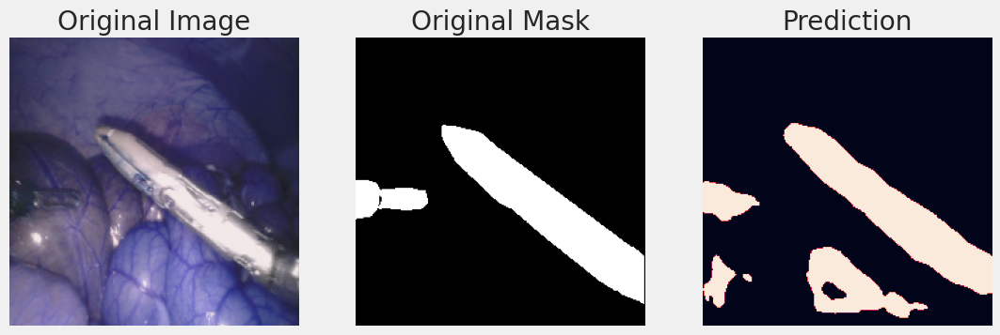

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


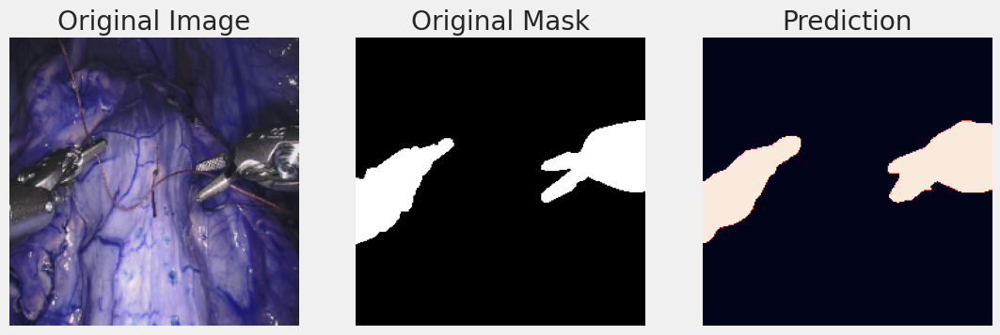

In [44]:
for _ in range(20):
    index = np.random.randint(1, len(test_df.index))
    img = cv2.imread(test_df['images_paths'].iloc[index])
    img = cv2.resize(img, (224, 224))
    img = img/255
    img = img[np.newaxis, :, :, : ]

    predicted_img = model.predict(img)

    plt.figure(figsize=(12, 12))
    
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(img))
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(cv2.imread(test_df['masks_paths'].iloc[index])))
    plt.axis('off')
    plt.title('Original Mask')

    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(predicted_img) > 0.5 )
    plt.title('Prediction')
    plt.axis('off')
    
    plt.show()

In [45]:
model.save('dep_mobile_2_unet.keras')

In [46]:
model.save('dep_mobile_2_unet_1.keras')